In [4]:
#generating an experimental dataset
from sklearn.datasets import make_classification
import numpy as np
X,y=make_classification(n_samples=100,n_features=2,n_informative=1,n_redundant=0,n_classes=2,
                        n_clusters_per_class=1,random_state=41,hypercube=False,class_sep=10)


In [5]:
X

array([[ 0.19924745, -0.11697552],
       [-0.24882029, -0.73115232],
       [-0.3544904 , -0.7081059 ],
       [-1.59086506, -2.01199214],
       [-0.20083951,  1.63493163],
       [-0.83241122,  0.15599044],
       [-1.79207014,  1.07782053],
       [ 0.0856607 ,  0.80626713],
       [-0.55865299,  0.74859527],
       [-1.95974262,  0.75152794],
       [-1.77828947, -0.90114581],
       [-1.77985853, -0.1815243 ],
       [-0.02194151, -2.98092432],
       [ 0.80563431,  1.20500136],
       [-1.82701214,  0.78302407],
       [ 0.38730728,  0.42968688],
       [-0.14108668, -0.73229726],
       [-1.87955941, -0.83930476],
       [-0.18232911,  0.83727062],
       [-1.77059533, -0.10255323],
       [-2.27658028,  0.65867001],
       [-2.06519502,  0.92649819],
       [-1.31690551,  0.10216193],
       [ 1.61043259,  0.46886454],
       [-1.21650394,  0.45432938],
       [ 0.6139723 ,  1.8613386 ],
       [-1.78760957, -0.79255991],
       [-1.04149161, -1.0004391 ],
       [-2.40067584,

In [6]:
y

array([1, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 0,
       0, 1, 0, 1, 0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 1,
       0, 1, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 0,
       1, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 1])

In [7]:
import matplotlib.pyplot as plt 

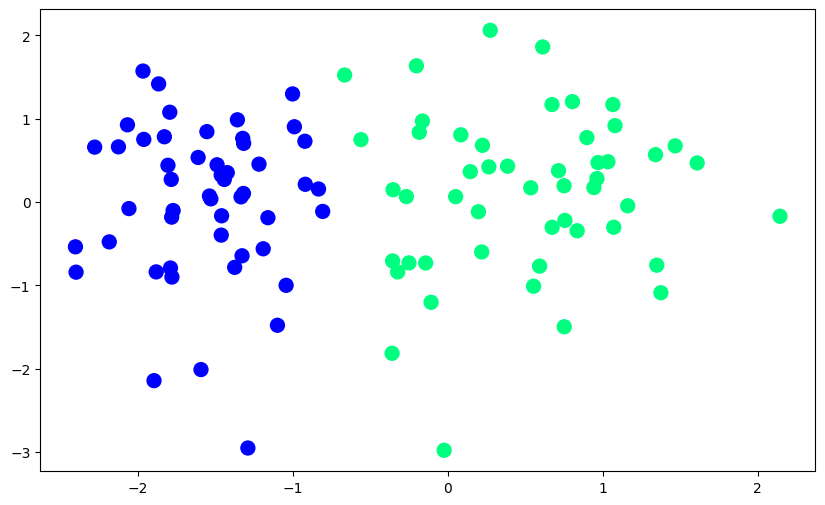

In [10]:
plt.figure(figsize=(10,6))
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)

In [16]:
def Perceptron(X,y):
    X=np.insert(X,0,1,axis=1)
    weight=np.ones(X.shape[1])
    lr=0.01
    epoch=1000
    for i in range(epoch):
        j=np.random.randint(100)
        y_hat=step(np.dot(X[j],weight))
        weight=weight+lr*(y[j]-y_hat)*X[j]
    return weight[0],weight[1:]

In [17]:
def step(z):
    return 1 if z>0 else 0
    

In [18]:
intercept_,coef_=Perceptron(X,y)

In [20]:
m=-coef_[0]/coef_[1]
c=-intercept_/coef_[1]

In [22]:
x_input=np.linspace(-3,3,100)
y_input=m*x_input+c

(-3.0, 2.0)

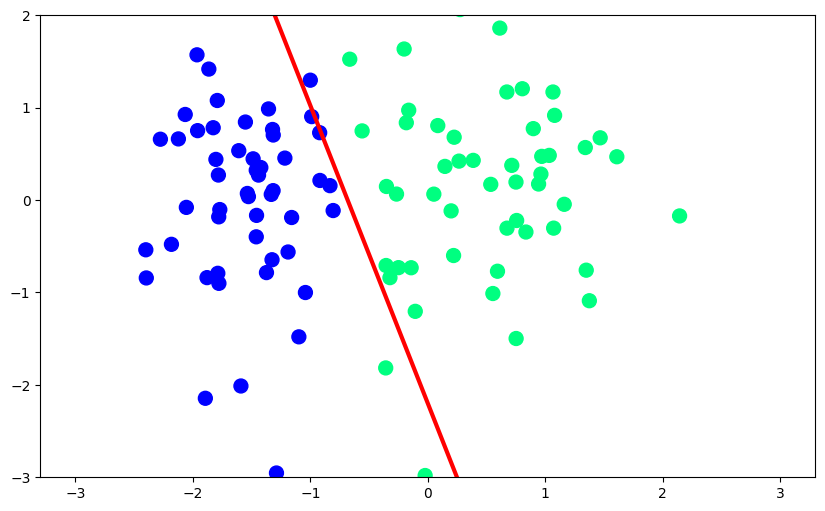

In [23]:
plt.figure(figsize=(10,6))
plt.plot(x_input,y_input,color='red',linewidth=3)
plt.scatter(X[:,0],X[:,1],c=y,cmap='winter',s=100)
plt.ylim(-3,2)

In [58]:
%matplotlib inline

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML


In [59]:
from sklearn.datasets import make_classification

X, y = make_classification(
    n_samples=100,
    n_features=2,
    n_informative=1,
    n_redundant=0,
    n_clusters_per_class=1,
    class_sep=1.5,
    random_state=42
)


In [60]:

def perceptron(X, y):
    X = np.insert(X, 0, 1, axis=1)
    w = np.ones(X.shape[1])
    lr = 0.1

    m_list = []
    b_list = []

    for _ in range(200):
        j = np.random.randint(0, X.shape[0])
        y_hat = 1 if np.dot(X[j], w) >= 0 else 0
        w = w + lr * (y[j] - y_hat) * X[j]

        m_list.append(-w[1] / w[2])
        b_list.append(-w[0] / w[2])

    return m_list, b_list


In [54]:
m, b = perceptron(X, y)

x_vals = np.linspace(-3, 3, 100)

fig, ax = plt.subplots(figsize=(8,5))
scatter = ax.scatter(X[:,0], X[:,1], c=y, cmap='winter', s=80)
line, = ax.plot(x_vals, m[0]*x_vals + b[0], 'r-', linewidth=2)
ax.set_ylim(-3, 3)




(-3.0, 3.0)

In [61]:
ax.set_title("Perceptron Learning")

def update(frame):
    line.set_ydata(m[frame] * x_vals + b[frame])
    ax.set_title(f"Epoch {frame+1}")
    return line,

ani = FuncAnimation(fig, update, frames=len(m), interval=80)
HTML(ani.to_jshtml())

'/Users/yashvikaushik/Documents/ArtificialIntelligence/Deep Learning'